## GR5241 Statistical Machine Learning
### Data Analysis Project Milestone 2
### Name: Kangshuo Li  UNI: kl3259
![](GR5241_PROJ2_Q3.png)
![](GR5241_PROJ2_Q4.png)

### Only Codes and comments here! For answers and description for problems, please check the Final_Report_kl3259.md

### Setup

In [44]:
import torch
import torchvision
from torchvision import transforms
from torch import nn
from torch import optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torch.autograd import Variable
import pandas as pd
import numpy as np
import sklearn
import matplotlib
from matplotlib import pyplot as plt
import time
import random
import os
import re
import pickle
%xmode plain
print(os.getcwd()) # on colab pro

Exception reporting mode: Plain
/content


In [45]:
# check GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
torch.cuda.is_available()

True

### Read in data

In [46]:
# Data download and preprocessing
from torch.utils import data

DOWNLOAD_MNIST = True # If already download , set as False

train_data = torchvision.datasets.MNIST(
    root ="./mnist/",
    train = True , # this is training data
    # transform = torchvision.transforms.ToTensor(),
    download = DOWNLOAD_MNIST
)
test_data = torchvision.datasets.MNIST(root = "./mnist/", train = False)

### Preprocessing

In [47]:
# preprocessing: normalized
X_train = torch.from_numpy(train_data.train_data.numpy() / 255).to(device)
X_test = torch.from_numpy(test_data.test_data.numpy() / 255).to(device)
Y_train = train_data.train_labels.to(device)
Y_test = test_data.test_labels.to(device)
train_data = TensorDataset(X_train, Y_train)
test_data = TensorDataset(X_test, Y_test)

# Y_train_onehot = F.one_hot(Y_train).to(device)
# Y_test_onehot = F.one_hot(Y_test).to(device)
# train_data_onehot = TensorDataset(X_train, Y_train_onehot)
# test_data_onehot = TensorDataset(X_test, Y_test_onehot)

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:75: UserWarning: train_data has been renamed data
  warnings.warn("train_data has been renamed data")
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:80: UserWarning: test_data has been renamed data
  warnings.warn("test_data has been renamed data")
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:65: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:70: UserWarning: test_labels has been renamed targets
  warnings.warn("test_labels has been renamed targets")


### Instantiate dataloader

In [ ]:
# instantiate dataloader
train_dataloader = DataLoader(train_data, batch_size = 64, shuffle = True)
test_dataloader = DataLoader(test_data, batch_size = 64, shuffle = True)

### 3. Single layer NN

In [ ]:
# define the structure single layer neural network
class single_layer_NN(nn.Module):
    def __init__(self):
        super(single_layer_NN, self).__init__()
        self.flatten = nn.Flatten()
        self.single_layer_nn = nn.Sequential(
            nn.Linear(784, 100),
            nn.Sigmoid(),
            nn.Linear(100, 10)
        )

    def forward(self, x):
        x = self.flatten(x)
        prob_softmax = self.single_layer_nn(x)
        return prob_softmax

# instantiate nn and move to GPU 
model_single_layer = single_layer_NN().to(device)
# print model structure
print(model_single_layer)

single_layer_NN(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (single_layer_nn): Sequential(
    (0): Linear(in_features=784, out_features=100, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=100, out_features=10, bias=True)
  )
)


In [5]:
# def the path for saving models
from google.colab import drive
drive.mount('/content/drive')
%mkdir '/content/drive/My Drive/GR5241/'
PATH = '/content/drive/My Drive/GR5241/'
os.getcwd()

Mounted at /content/drive
mkdir: cannot create directory ‘/content/drive/My Drive/GR5241/’: File exists


'/content'

In [ ]:
def train_loop(dataloader_, model_, loss_fn_, optimizer_, epoch_, seed_):
    size = len(dataloader_.dataset)
    num_batches = len(dataloader_)
    sum_cross_entropy_error = 0
    correct_case = 0
    for step, (batch_x, batch_y) in enumerate(dataloader_):
        # Compute prediction and loss
        prediction = model_(batch_x.float())
        loss = loss_fn_(prediction, batch_y)
        sum_cross_entropy_error += loss_fn_(prediction, batch_y).item()
        correct_case += (prediction.argmax(1) == batch_y).type(torch.float).sum().item()

        # Backpropagation
        optimizer_.zero_grad()
        loss.backward()
        optimizer.step()

    # print when finished
    avg_cross_entropy_error = sum_cross_entropy_error / size
    avg_mis_clf_error = 1 - correct_case / size
    print(f"Current seed: {seed_:8d}|Train Loss - cross entropy: {avg_cross_entropy_error:10.6f}|Train Loss - mis-clf: {avg_mis_clf_error:10.6f}")
    return avg_cross_entropy_error, avg_mis_clf_error

def test_loop(dataloader_, model_, loss_fn_, seed_):
    size = len(dataloader_.dataset)
    num_batches = len(dataloader_)
    sum_cross_entropy_error, correct_case = 0, 0

    with torch.no_grad():
        for step, (batch_x, batch_y) in enumerate(dataloader_):
            prediction = model_(batch_x.float())
            sum_cross_entropy_error += loss_fn_(prediction, batch_y).item()
            # test_loss += loss_fn_(prediction, batch_y).item()
            correct_case += (prediction.argmax(1) == batch_y).type(torch.float).sum().item()

    # test_loss /= num_batches
    correct_case /= size
    avg_mis_clf_error = 1 - correct_case
    avg_cross_entropy_error = sum_cross_entropy_error / size
    print(f"Test Accuracy: {(100 * correct_case):6.2f}%|Test Loss - cross entropy: {avg_cross_entropy_error:11.6f}|Test Loss - mis-clf: {avg_mis_clf_error:11.6f} \n")
    return avg_cross_entropy_error, avg_mis_clf_error

# try at least 5 times with different random seed
start_time = time.time()
random_seed_list = [42, 422, 442, 4222, 4422, 4442]
learning_rate = 0.1
batch_size = 64
epochs = 200
for seed in random_seed_list:
    # create the dataframe for storing the two types of loss used in 3(a) and 3(b)
    globals()['loss_df_' + str(seed)] = pd.DataFrame(
        data = np.zeros((epochs, 4)), 
        columns = ["Cross_entropy_error_train", "Misclassification_error_train", "Cross_entropy_error_test", "Misclassification_error_test"], 
        index = np.arange(1, epochs + 1, dtype = int)
    )
    # random.seed(seed)
    torch.manual_seed(seed)
    # create new single layer NN
    # re-instantiate NN and move to GPU 
    model_single_layer = single_layer_NN().to(device)
    # create optimizer
    optimizer = optim.SGD(
        model_single_layer.parameters(), 
        lr = learning_rate
    )
    # create cost function
    loss_fn = nn.CrossEntropyLoss(reduction = 'sum') # multiclass classification
    # specifiying reduction with 'sum' and compute the mean with number of examples inside the train test loops
    # default is 'mean' for weighted mean
    print(f"Seed {seed}\n================================================================================================")
    for t in np.arange(epochs):
        print(f"Epoch {t + 1}\n------------------------------------------------------------------------------------------------")
        avg_corss_entropy_error_train, avg_mis_clf_error_train = train_loop(
            dataloader_ = train_dataloader, 
            model_ = model_single_layer, 
            loss_fn_ = loss_fn, 
            optimizer_ = optimizer, 
            epoch_ = epochs,
            seed_ = seed
        )
        avg_corss_entropy_error_test, avg_mis_clf_error_test = test_loop(
            dataloader_ = test_dataloader, 
            model_ = model_single_layer, 
            loss_fn_ = loss_fn, 
            seed_ = seed
        )
        # add two types of errors to their corresponding df
        globals()['loss_df_' + str(seed)].loc[(t + 1), "Cross_entropy_error_train"] = avg_corss_entropy_error_train
        globals()['loss_df_' + str(seed)].loc[(t + 1), "Misclassification_error_train"] = avg_mis_clf_error_train
        globals()['loss_df_' + str(seed)].loc[(t + 1), "Cross_entropy_error_test"] = avg_corss_entropy_error_test
        globals()['loss_df_' + str(seed)].loc[(t + 1), "Misclassification_error_test"] = avg_mis_clf_error_test
    # save model
    torch.save(model_single_layer, PATH + "model_single_layer_seed_" + str(seed) + ".pkl")

print(f"================================================================================================")
time_cost = time.time() - start_time
print(f'Finished! Time cost: {time_cost:0.4f}s') # on colab pro


Streaming output truncated to the last 5000 lines.
Epoch 3
------------------------------------------------------------------------------------------------
Current seed:      422|Train Loss - cross entropy:   0.379198|Train Loss - mis-clf:   0.105467
Test Accuracy:  91.30%|Test Loss - cross entropy:    0.331553|Test Loss - mis-clf:    0.087000 

Epoch 4
------------------------------------------------------------------------------------------------
Current seed:      422|Train Loss - cross entropy:   0.337065|Train Loss - mis-clf:   0.093900
Test Accuracy:  91.17%|Test Loss - cross entropy:    0.316252|Test Loss - mis-clf:    0.088300 

Epoch 5
------------------------------------------------------------------------------------------------
Current seed:      422|Train Loss - cross entropy:   0.311324|Train Loss - mis-clf:   0.088533
Test Accuracy:  92.00%|Test Loss - cross entropy:    0.310685|Test Loss - mis-clf:    0.080000 

Epoch 6
--------------------------------------------------

In [ ]:
# save the loss_dfs
for seed in random_seed_list:
    with open(PATH + "loss_df_seed_" + str(seed) + ".pkl", 'wb') as file:
        pickle.dump(globals()['loss_df_' + str(seed)], file)

#### (a)

In [110]:
def plot_error(fig_title, loss_df = None, suffix = "", random_seed_list = None, error_type = "Cross_entropy", lay_out = "single"):
    '''
    Input: loss_df for the loss function value at each epoch of both type and 
           both training and testing set
           lay_out: control the output fig whether for "multi_seeds" or "single"
           suffix： "cnn_" to plot loss function of CNN
    Output: fig file in png + show the fig inline
    '''
    # style setup
    plt.style.use('ggplot')
    plt.rcParams["font.weight"] = "bold"
    plt.rcParams["axes.labelweight"] = "bold"
    plt.rcParams["axes.titleweight"] = "bold"
    if lay_out == "single":
        # use loss_df local variable
        fig, ax = plt.subplots(1, 1, figsize = (6, 6), dpi = 320)
        epoch_list = np.arange(1, loss_df.shape[0] + 1, dtype = int)
        train_loss_list = loss_df.loc[:, error_type + "_error_train"]
        test_loss_list = loss_df.loc[:, error_type + "_error_test"]
        if error_type == "Misclassification":
            train_loss_list *= 100
            test_loss_list *= 100
        ax.plot(epoch_list, train_loss_list, '-', label = "Training loss", linewidth = 2)
        ax.plot(epoch_list, test_loss_list, '-', label = "Validation loss", linewidth = 2)
        ax.legend()
        ax.set_title('Learning Curve: ' + fig_title)
        ax.set_xlabel('Epochs')
        if error_type == "Misclassification":
            ax.set_ylabel('Loss(%)')
        else:
            ax.set_ylabel('Loss')
        fig.savefig(
            PATH + "learning_curve_" + fig_title + ".png", 
            format = "png"
        )
        plt.show()
    elif lay_out == "multi_seeds":
        # use random seed and global dfs to get loss_df data
        assert random_seed_list != None
        fig, ax = plt.subplots(2, 3, figsize = (16, 10), dpi = 320)
        count = 0
        for i in np.arange(2): # row
            for j in np.arange(3): # col
                curr_ax = ax[i, j]
                # suffix： "cnn_" to plot loss function of CNN
                curr_loss_df = globals()['loss_df_' + suffix + str(random_seed_list[count])]
                curr_epoch_list = np.arange(1, curr_loss_df.shape[0] + 1, dtype = int)
                curr_train_loss_list = curr_loss_df.loc[:, error_type + "_error_train"]
                curr_test_loss_list = curr_loss_df.loc[:, error_type + "_error_test"]
                if error_type == "Misclassification":
                    curr_train_loss_list *= 100
                    curr_test_loss_list *= 100
                curr_ax.plot(curr_epoch_list, curr_train_loss_list, '-', label = "Training loss", linewidth = 2)
                curr_ax.plot(curr_epoch_list, curr_test_loss_list, '-', label = "Validation loss", linewidth = 2)
                curr_ax.legend()
                curr_ax.set_title('Seed: ' + str(random_seed_list[count]))
                curr_ax.set_xlabel('Epochs')
                if error_type == "Misclassification":
                    curr_ax.set_ylabel('Loss(%)')
                else:
                    curr_ax.set_ylabel('Loss')
                count += 1 # udpate random seed and corresponding loss_df
        fig.suptitle(fig_title, fontsize = 16, weight = "bold")
        fig.savefig(
            PATH + "learning_curve_" + suffix + fig_title + ".png", 
            format = "png"
        )
        plt.show()
    pass

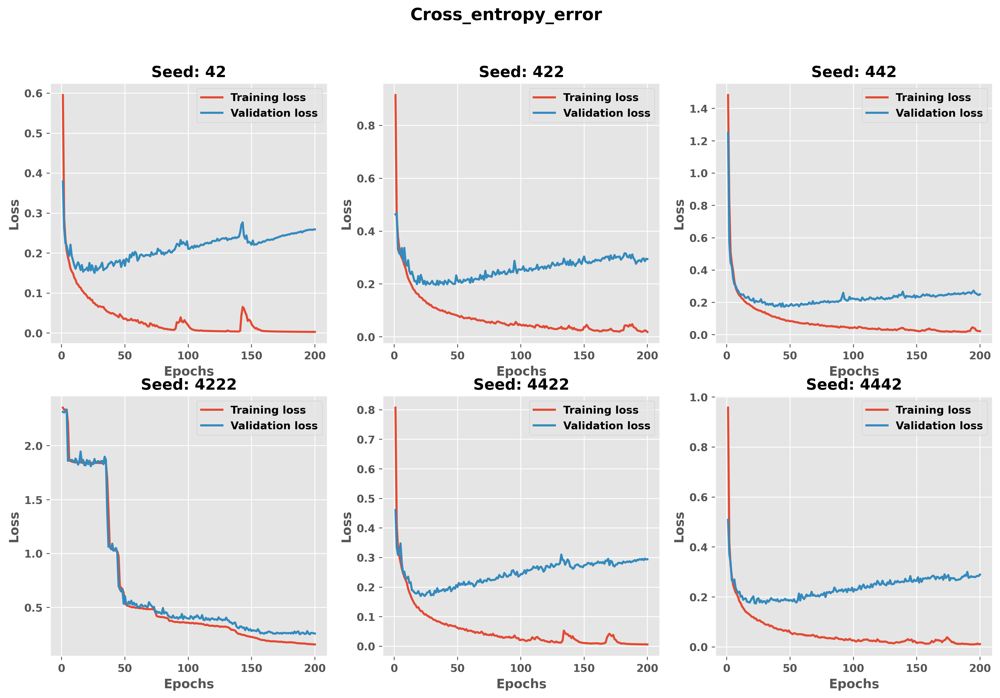

In [ ]:
# Ex: plot cross-entropy error curve for NN with a single seed
# plot_error(
#     loss_df = loss_df_42, 
#     fig_title = "Cross_entropy_error_seed_42", 
#     error_type = "Cross_entropy", 
#     lay_out = "single"
# )

# plot the cross-entropy error curve for all seeds
plot_error(
    random_seed_list = random_seed_list, 
    fig_title = "Cross_entropy_error", 
    error_type = "Cross_entropy", 
    lay_out = "multi_seeds"
)

#### (b)

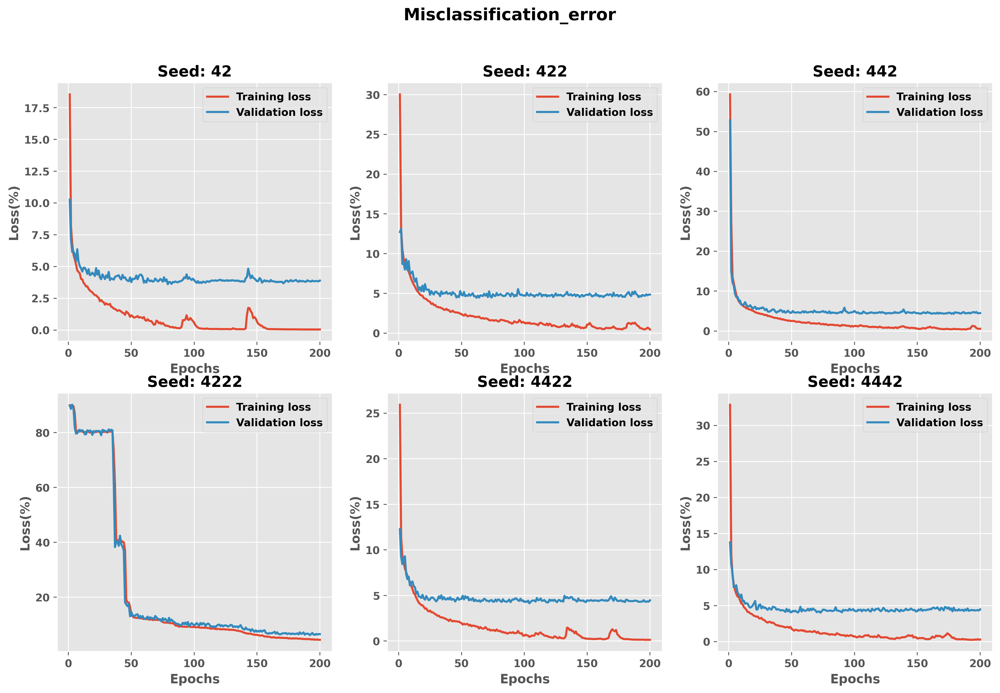

In [ ]:
# plot the learning curve with respect to mis-classification error of all initializations
# use the plot_error() function
plot_error(
    random_seed_list = random_seed_list, 
    fig_title = "Misclassification_error", 
    error_type = "Misclassification", 
    lay_out = "multi_seeds"
)

#### (c)

In [ ]:
# select the bset result
# compare their training and testing error after the training process
# also consider the accuracy

result_df = pd.DataFrame(
    data = None, 
    columns = ["Cross_entropy_error_train", "Misclassification_error_train", "Cross_entropy_error_test", "Misclassification_error_test"], 
)
# mean misclassifcation error can reveal the test accuracy
for seed in random_seed_list:
    result_df = result_df.append(globals()['loss_df_' + str(seed)].tail(1))
result_df.index = random_seed_list
result_df["Accuracy_test"] = 100 - result_df["Misclassification_error_test"]
result_df["Misclassification_error_test"] /= 100
display(result_df)

,Cross_entropy_error_train,Misclassification_error_train,Cross_entropy_error_test,Misclassification_error_test,Accuracy_test
42,0.002937,0.045000,0.259231,0.0389,96.11
422,0.018808,0.451667,0.294355,0.0485,95.15
442,0.021964,0.583333,0.250466,0.0450,95.50
4222,0.156996,4.453333,0.258184,0.0653,93.47
4422,0.006148,0.131667,0.294285,0.0447,95.53
4442,0.011437,0.285000,0.289813,0.0447,95.53


In [ ]:
# save this table
with open(PATH + '3_c_table.pkl', 'wb') as file:
    pickle.dump(result_df, file)

In [ ]:
def plot_param(params, grid_height = 10, grid_width = 10):
    '''
    Input: height * width the grid has
           and the params in the only layer we have
    Output: fig file in png + show the fig inline
    '''
    # style setup
    plt.style.use('ggplot')
    plt.rcParams["font.weight"] = "bold"
    plt.rcParams["axes.labelweight"] = "bold"
    plt.rcParams["axes.titleweight"] = "bold"
    # create figure
    fig, ax = plt.subplots(grid_height, grid_width, figsize = (8,8), dpi = 320)
    count = 0
    for i in np.arange(grid_height):
        for j in np.arange(grid_width):
            curr_ax = ax[i, j]
            # get the count-th row of the parameters, reshape it into 28 * 28
            curr_ax.imshow(params[count].reshape((28, 28)), cmap = "gray", interpolation = "nearest") 
            curr_ax.axis("off")
            count += 1
    plt.subplots_adjust(wspace = 0, hspace = 0)
    fig.savefig(
        PATH + "param_best_model.png", 
        format = "png"
    )
    plt.show()
    pass

(100, 784)


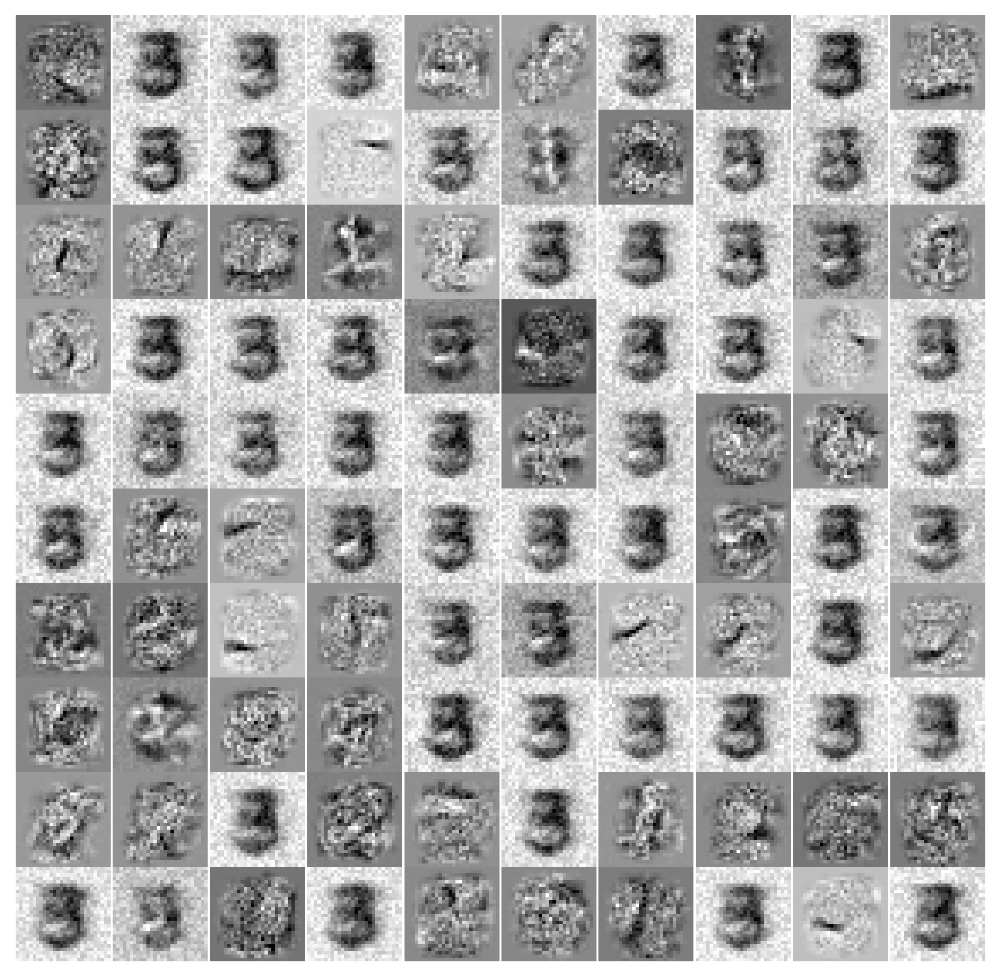

In [ ]:
# visualize the best result W
# shape: 28 * 28 * 100 in the layer Linear(784, 100)

# load the best model with random seed 42
best_model = torch.load(PATH + 'model_single_layer_seed_42.pkl')

params = list(best_model.parameters())[0] # tensor on GPU, shape: 100 * 784
params = params.cpu().detach().numpy()
print(params.shape)

plot_param(
    params = params, 
    grid_height = 10, 
    grid_width = 10
)


#### (d)

In [ ]:
# only try the learning rate and the momentum with the best model selected
learning_rate_list = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5] # in SGD lr
momentum_list = [0.0, 0.5, 0.9] # default in SGD: 0
# pick the best random seed to reproduce the best model
best_random_seed = 42
# set n_epochs reduced to 160 -> already overfitting at epoch 50
epochs = 160

# grid search: learning rate + momentum
for curr_lr in learning_rate_list:
    for curr_mmt in momentum_list:
        # create the dataframe for storing the two types of loss used in 3(a) and 3(b)
        torch.manual_seed(best_random_seed) # 42
        # use new dfs
        globals()['loss_df_lr_' + str(curr_lr) + 'mmt_' + str(curr_mmt)] = pd.DataFrame(
            data = np.zeros((epochs, 4)), 
            columns = ["Cross_entropy_error_train", "Misclassification_error_train", "Cross_entropy_error_test", "Misclassification_error_test"], 
            index = np.arange(1, epochs + 1, dtype = int)
        )
        # random.seed(seed)
        torch.manual_seed(seed)
        # create new single layer NN
        # re-instantiate NN and move to GPU 
        model_single_layer = single_layer_NN().to(device)
        # create optimizer with params on grid
        optimizer = optim.SGD(
            model_single_layer.parameters(), 
            lr = curr_lr, 
            momentum = curr_mmt
        )
        # create cost function
        loss_fn = nn.CrossEntropyLoss(reduction = 'sum') # multiclass classification
        # specifiying reduction with 'sum' and compute the mean with number of examples inside the train test loops
        # training like in 3(a)
        print(f"Seed: {best_random_seed} | Learning rate: {curr_lr:4.2f} | Momentum: {curr_mmt:4.1f}\n================================================================================================")
        for t in np.arange(epochs):
            print(f"Epoch {t + 1}\n------------------------------------------------------------------------------------------------")
            avg_corss_entropy_error_train, avg_mis_clf_error_train = train_loop(
                dataloader_ = train_dataloader, 
                model_ = model_single_layer, 
                loss_fn_ = loss_fn, 
                optimizer_ = optimizer, 
                epoch_ = epochs,
                seed_ = best_random_seed
            )
            avg_corss_entropy_error_test, avg_mis_clf_error_test = test_loop(
                dataloader_ = test_dataloader, 
                model_ = model_single_layer, 
                loss_fn_ = loss_fn, 
                seed_ = best_random_seed
            )
            # add two types of errors to their corresponding df
            globals()['loss_df_lr_' + str(curr_lr) + 'mmt_' + str(curr_mmt)].loc[(t + 1), "Cross_entropy_error_train"] = avg_corss_entropy_error_train
            globals()['loss_df_lr_' + str(curr_lr) + 'mmt_' + str(curr_mmt)].loc[(t + 1), "Misclassification_error_train"] = avg_mis_clf_error_train
            globals()['loss_df_lr_' + str(curr_lr) + 'mmt_' + str(curr_mmt)].loc[(t + 1), "Cross_entropy_error_test"] = avg_corss_entropy_error_test
            globals()['loss_df_lr_' + str(curr_lr) + 'mmt_' + str(curr_mmt)].loc[(t + 1), "Misclassification_error_test"] = avg_mis_clf_error_test
        # save model
        torch.save(model_single_layer, PATH + "model_single_layer_best_lr" + str(curr_lr) + "_mmt" + str(curr_mmt) + ".pkl")

print(f"================================================================================================")
time_cost = time.time() - start_time
print(f'Finished! Time cost: {time_cost:0.4f}s')

Streaming output truncated to the last 5000 lines.

Epoch 124
------------------------------------------------------------------------------------------------
Current seed:       42|Train Loss - cross entropy:   2.615990|Train Loss - mis-clf:   0.897233
Test Accuracy:   9.82%|Test Loss - cross entropy:    2.643618|Test Loss - mis-clf:    0.901800 

Epoch 125
------------------------------------------------------------------------------------------------
Current seed:       42|Train Loss - cross entropy:   2.587065|Train Loss - mis-clf:   0.897283
Test Accuracy:  10.09%|Test Loss - cross entropy:    2.782662|Test Loss - mis-clf:    0.899100 

Epoch 126
------------------------------------------------------------------------------------------------
Current seed:       42|Train Loss - cross entropy:   2.619530|Train Loss - mis-clf:   0.899733
Test Accuracy:  10.28%|Test Loss - cross entropy:    2.662092|Test Loss - mis-clf:    0.897200 

Epoch 127
-----------------------------------------

In [ ]:
# visualize the error by defining a altered plot_error function
def plot_error_alt(fig_title, lr_list, mmt_list, loss_df = None, error_type = "Cross_entropy", lay_out = "single"):
    '''
    Input: loss_df for the loss function value at each epoch of both type and 
           both training and testing set
           lay_out: control the output fig whether for "multi_seeds" or "single"
    Output: fig file in png + show the fig inline
    '''
    # style setup
    plt.style.use('ggplot')
    plt.rcParams["font.weight"] = "bold"
    plt.rcParams["axes.labelweight"] = "bold"
    plt.rcParams["axes.titleweight"] = "bold"
    if lay_out == "single":
        # use loss_df local variable
        fig, ax = plt.subplots(1, 1, figsize = (6, 6), dpi = 320)
        epoch_list = np.arange(1, loss_df.shape[0] + 1, dtype = int)
        train_loss_list = loss_df.loc[:, error_type + "_error_train"]
        test_loss_list = loss_df.loc[:, error_type + "_error_test"]
        if error_type == "Misclassification":
            train_loss_list *= 100
            test_loss_list *= 100
        ax.plot(epoch_list, train_loss_list, '-', label = "Training loss", linewidth = 2)
        ax.plot(epoch_list, test_loss_list, '-', label = "Validation loss", linewidth = 2)
        ax.legend()
        ax.set_title('Learning Curve: ' + fig_title)
        ax.set_xlabel('Epochs')
        if error_type == "Misclassification":
            ax.set_ylabel('Loss(%)')
        else:
            ax.set_ylabel('Loss')
        fig.savefig(
            PATH + "learning_curve_lr_mmt_" + fig_title + ".png", 
            format = "png"
        )
        plt.show()
    elif lay_out == "multi_seeds":
        # use random seed and global dfs to get loss_df data
        assert lr_list != None
        assert mmt_list != None
        fig, ax = plt.subplots(len(lr_list), len(mmt_list), figsize = (25, 40), dpi = 320)
        count = 0
        for i in np.arange(len(lr_list)): # col: mmt
            for j in np.arange(len(mmt_list)): # row: lr
                curr_ax = ax[i, j]
                curr_loss_df = globals()['loss_df_lr_' + str(lr_list[i]) + 'mmt_' + str(mmt_list[j])]
                curr_epoch_list = np.arange(1, curr_loss_df.shape[0] + 1, dtype = int)
                curr_train_loss_list = curr_loss_df.loc[:, error_type + "_error_train"]
                curr_test_loss_list = curr_loss_df.loc[:, error_type + "_error_test"]
                if error_type == "Misclassification":
                    curr_train_loss_list *= 100
                    curr_test_loss_list *= 100
                curr_ax.plot(curr_epoch_list, curr_train_loss_list, '-', label = "Training loss", linewidth = 2)
                curr_ax.plot(curr_epoch_list, curr_test_loss_list, '-', label = "Validation loss", linewidth = 2)
                curr_ax.legend()
                curr_ax.set_title('LR:' + str(lr_list[i]) + ' Momentum:' + str(mmt_list[j]))
                curr_ax.set_xlabel('Epochs')
                if error_type == "Misclassification":
                    curr_ax.set_ylabel('Loss(%)')
                else:
                    curr_ax.set_ylabel('Loss')
                count += 1 # udpate random seed and corresponding loss_df
        fig.suptitle(fig_title, fontsize = 16, weight = "bold")
        plt.subplots_adjust(left = None, bottom = None, right = None, top = 0.96, wspace = 0.3, hspace = 0.2)
        # fig.tight_layout()
        fig.savefig(
            PATH + "learning_curve_lr_mmt_" + fig_title + ".png", 
            format = "png"
        )
        plt.show()
    pass

In [ ]:
plot_error_alt(
    fig_title = "Cross_entropy_error", 
    lr_list = learning_rate_list, 
    mmt_list = momentum_list,
    error_type = "Cross_entropy", 
    lay_out = "multi_seeds"
)

In [ ]:
plot_error_alt(
    fig_title = "Misclassification_error", 
    lr_list = learning_rate_list, 
    mmt_list = momentum_list,
    error_type = "Misclassification", 
    lay_out = "multi_seeds"
)

In [ ]:
result_df_alt = pd.DataFrame(
    data = None, 
    columns = ["Cross_entropy_error_train", "Misclassification_error_train", "Cross_entropy_error_test", "Misclassification_error_test"], 
)
index_list = []
# mean misclassifcation error can reveal the test accuracy
for i in np.arange(len(learning_rate_list)): # col: mmt
    for j in np.arange(len(momentum_list)): # row: lr
        result_df_alt = result_df_alt.append(globals()['loss_df_lr_' + str(learning_rate_list[i]) + 'mmt_' + str(momentum_list[j])].tail(1))
        index_list.append(str(learning_rate_list[i]) + "_" + str(momentum_list[j]))
result_df_alt.index = index_list
result_df_alt["Accuracy_test"] = 100 - result_df_alt["Misclassification_error_test"]
result_df_alt["Misclassification_error_test"] /= 100
display(result_df_alt)

,Cross_entropy_error_train,Misclassification_error_train,Cross_entropy_error_test,Misclassification_error_test,Accuracy_test
0.01_0.0,0.000751,0.000000,0.086001,0.0197,98.03
0.01_0.5,0.000326,0.000000,0.094303,0.0206,97.94
0.01_0.9,0.000068,0.000000,0.117996,0.0216,97.84
0.02_0.0,0.000325,0.000000,0.087719,0.0192,98.08
0.02_0.5,0.000159,0.000000,0.103002,0.0221,97.79
0.02_0.9,0.004041,0.088333,0.238982,0.0345,96.55
0.05_0.0,0.000388,0.000000,0.197699,0.0304,96.96
0.05_0.5,0.001813,0.028333,0.233049,0.0364,96.36
0.05_0.9,1.035470,35.901667,1.054175,0.3657,63.43
0.1_0.0,0.013729,0.366667,0.273264,0.0452,95.48


In [ ]:
# save this table
with open(PATH + '3_d_table.pkl', 'wb') as file:
    pickle.dump(result_df_alt, file)

### 4. CNN

#### (a)

In [106]:
# define the structure of CNN
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(1, 16, (5,5), stride = 1, padding = 2), # greyscale -> 16 * 28 * 28
            nn.ReLU(), 
            nn.MaxPool2d((2,2), stride = 2) # 16 * 14 * 14
        )
        self.flatten = nn.Flatten()
        self.single_layer_nn = nn.Sequential(
            nn.Linear(3136, 10)
        )

    def forward(self, x):
        x = self.conv(x)
        x = self.flatten(x)
        prob = self.single_layer_nn(x)
        return prob

# instantiate CNN and move to GPU 
model_cnn = CNN().to(device)
# print model structure
print(model_cnn)

CNN(
  (conv): Sequential(
    (0): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=(2, 2), stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (single_layer_nn): Sequential(
    (0): Linear(in_features=3136, out_features=10, bias=True)
  )
)


#### Reshape the data by adding channel dimension

In [107]:
# reload the data with transformation ToTensor
train_data = torchvision.datasets.MNIST(
    root ="./mnist/",
    train = True , # this is training data
    # transform = torchvision.transforms.ToTensor(),
    download = DOWNLOAD_MNIST, 
    transform = transforms.ToTensor()
)
test_data = torchvision.datasets.MNIST(
    root = "./mnist/", 
    train = False, 
    transform = transforms.ToTensor()
)

# preprocessing: normalized
X_train = torch.from_numpy(train_data.train_data.numpy() / 255)
X_test = torch.from_numpy(test_data.test_data.numpy() / 255)
X_train = X_train.unsqueeze(1).to(device) # add channel dimension
assert X_train.shape == torch.Size([60000, 1, 28, 28])
X_test = X_test.unsqueeze(1).to(device)  # add channel dimension
assert X_test.shape == torch.Size([10000, 1, 28, 28])
Y_train = train_data.train_labels.to(device)
Y_test = test_data.test_labels.to(device)
train_data = TensorDataset(X_train, Y_train)
test_data = TensorDataset(X_test, Y_test)

# re-instantiate dataloader
batch_size = 100
train_dataloader = DataLoader(train_data, batch_size = batch_size, shuffle = True)
test_dataloader = DataLoader(test_data, batch_size = batch_size, shuffle = True)

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:75: UserWarning: train_data has been renamed data
  warnings.warn("train_data has been renamed data")
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:80: UserWarning: test_data has been renamed data
  warnings.warn("test_data has been renamed data")
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:65: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:70: UserWarning: test_labels has been renamed targets
  warnings.warn("test_labels has been renamed targets")


In [108]:
def train_loop(dataloader_, model_, loss_fn_, optimizer_, epoch_, seed_):
    size = len(dataloader_.dataset)
    num_batches = len(dataloader_)
    sum_cross_entropy_error = 0
    correct_case = 0
    for step, (batch_x, batch_y) in enumerate(dataloader_):
        # batch_x.shape 100 * 1 * 28 * 28
        # Compute prediction and loss
        prediction = model_(batch_x.float())
        loss = loss_fn_(prediction, batch_y)
        sum_cross_entropy_error += loss_fn_(prediction, batch_y).item()
        correct_case += (prediction.argmax(1) == batch_y).type(torch.float).sum().item()

        # Backpropagation
        optimizer_.zero_grad()
        loss.backward()
        optimizer.step()

    # print when finished
    avg_cross_entropy_error = sum_cross_entropy_error / size
    avg_mis_clf_error = 1 - correct_case / size
    print(f"Current seed: {seed_:8d}|Train Loss - cross entropy: {avg_cross_entropy_error:10.6f}|Train Loss - mis-clf: {avg_mis_clf_error:10.6f}")
    return avg_cross_entropy_error, avg_mis_clf_error

def test_loop(dataloader_, model_, loss_fn_, seed_):
    size = len(dataloader_.dataset)
    num_batches = len(dataloader_)
    sum_cross_entropy_error, correct_case = 0, 0

    with torch.no_grad():
        for step, (batch_x, batch_y) in enumerate(dataloader_):
            prediction = model_(batch_x.float())
            sum_cross_entropy_error += loss_fn_(prediction, batch_y).item()
            # test_loss += loss_fn_(prediction, batch_y).item()
            correct_case += (prediction.argmax(1) == batch_y).type(torch.float).sum().item()

    # test_loss /= num_batches
    correct_case /= size
    avg_mis_clf_error = 1 - correct_case
    avg_cross_entropy_error = sum_cross_entropy_error / size
    print(f"Test Accuracy: {(100 * correct_case):6.2f}%|Test Loss - cross entropy: {avg_cross_entropy_error:11.6f}|Test Loss - mis-clf: {avg_mis_clf_error:11.6f} \n")
    return avg_cross_entropy_error, avg_mis_clf_error


# try at least 5 times with different random seed
start_time = time.time()
random_seed_list = [42, 422, 442, 4222, 4422, 4442]
learning_rate = 0.001 # lower the learning rate, 0.01 lr cannot converge
epochs = 80 # down to 80 since CNN would tend to more overfitting than single layer NN
# can observe overfitting pattern at around 40th epoch
for seed in random_seed_list:
    # create the dataframe for storing the two types of loss used in 4(a) and 4(b)
    globals()['loss_df_cnn_' + str(seed)] = pd.DataFrame(
        data = np.zeros((epochs, 4)), 
        columns = ["Cross_entropy_error_train", "Misclassification_error_train", "Cross_entropy_error_test", "Misclassification_error_test"], 
        index = np.arange(1, epochs + 1, dtype = int)
    )
    torch.manual_seed(seed)
    # create new CNN
    model_cnn = CNN().to(device)
    # create optimizer
    optimizer = optim.SGD(
        model_cnn.parameters(), 
        lr = learning_rate
    )
    # create cost function
    loss_fn = nn.CrossEntropyLoss(reduction = 'sum') # multiclass classification
    # specifiying reduction with 'sum' and compute the mean with number of examples inside the train test loops
    # default is 'mean' for weighted mean
    print(f"Seed {seed}\n================================================================================================")
    for t in np.arange(epochs):
        print(f"Epoch {t + 1}\n------------------------------------------------------------------------------------------------")
        avg_corss_entropy_error_train, avg_mis_clf_error_train = train_loop(
            dataloader_ = train_dataloader, 
            model_ = model_cnn, 
            loss_fn_ = loss_fn, 
            optimizer_ = optimizer, 
            epoch_ = epochs,
            seed_ = seed
        )
        avg_corss_entropy_error_test, avg_mis_clf_error_test = test_loop(
            dataloader_ = test_dataloader, 
            model_ = model_cnn, 
            loss_fn_ = loss_fn, 
            seed_ = seed
        )
        # add two types of errors to their corresponding df
        globals()['loss_df_cnn_' + str(seed)].loc[(t + 1), "Cross_entropy_error_train"] = avg_corss_entropy_error_train
        globals()['loss_df_cnn_' + str(seed)].loc[(t + 1), "Misclassification_error_train"] = avg_mis_clf_error_train
        globals()['loss_df_cnn_' + str(seed)].loc[(t + 1), "Cross_entropy_error_test"] = avg_corss_entropy_error_test
        globals()['loss_df_cnn_' + str(seed)].loc[(t + 1), "Misclassification_error_test"] = avg_mis_clf_error_test
    # save model
    torch.save(model_cnn, PATH + "model_cnn_seed_" + str(seed) + ".pkl")

print(f"================================================================================================")
time_cost = time.time() - start_time
print(f'Finished! Time cost: {time_cost:0.4f}s') # on colab pro

Seed 42
Epoch 1
------------------------------------------------------------------------------------------------
Current seed:       42|Train Loss - cross entropy:   0.345271|Train Loss - mis-clf:   0.104183
Test Accuracy:  95.77%|Test Loss - cross entropy:    0.146096|Test Loss - mis-clf:    0.042300 

Epoch 2
------------------------------------------------------------------------------------------------
Current seed:       42|Train Loss - cross entropy:   0.125498|Train Loss - mis-clf:   0.035983
Test Accuracy:  97.56%|Test Loss - cross entropy:    0.084182|Test Loss - mis-clf:    0.024400 

Epoch 3
------------------------------------------------------------------------------------------------
Current seed:       42|Train Loss - cross entropy:   0.087348|Train Loss - mis-clf:   0.024900
Test Accuracy:  97.94%|Test Loss - cross entropy:    0.068628|Test Loss - mis-clf:    0.020600 

Epoch 4
---------------------------------------------------------------------------------------------

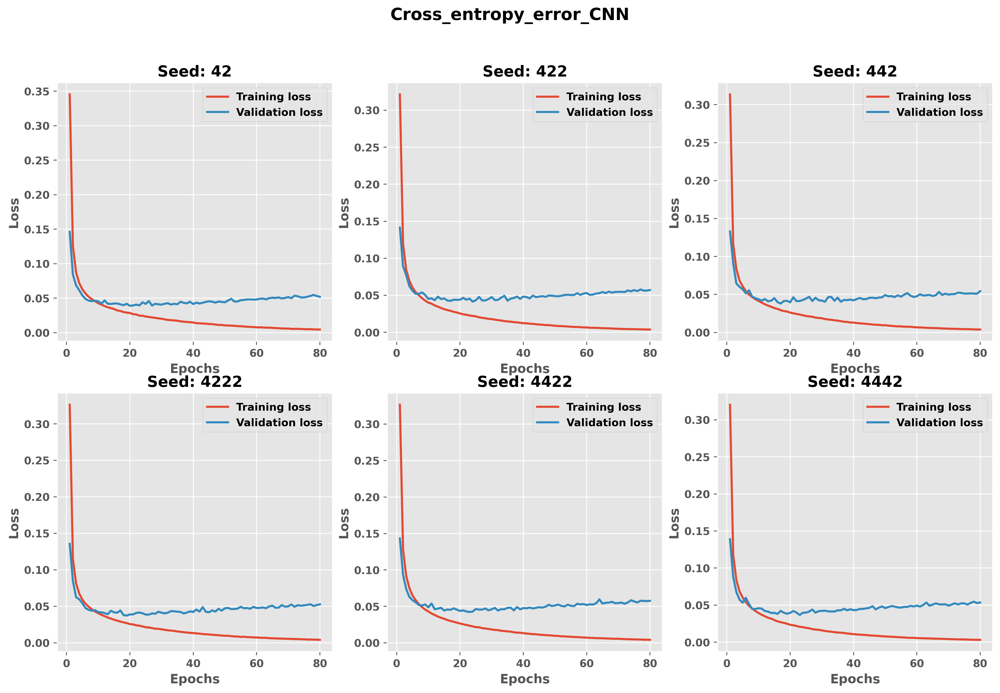

In [111]:
# plot the cross-entropy error curve for all CNNs
plot_error(
    random_seed_list = random_seed_list, 
    fig_title = "Cross_entropy_error_CNN", 
    error_type = "Cross_entropy", 
    lay_out = "multi_seeds", 
    suffix = "cnn_"
)

#### (b)

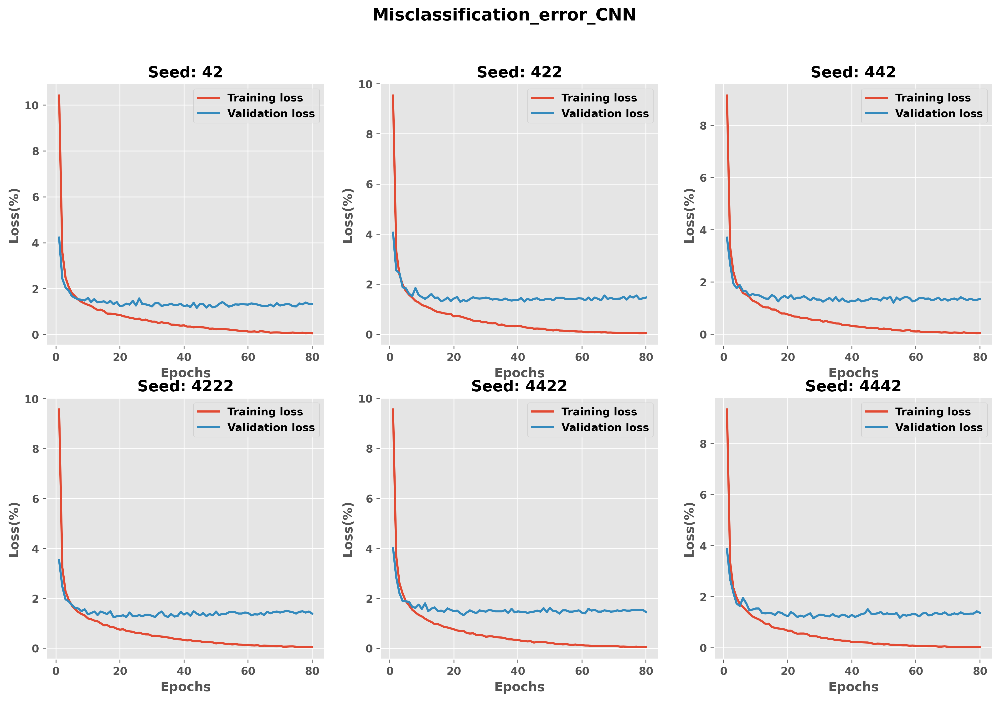

In [112]:
# plot the cross-entropy error curve for all CNNs
plot_error(
    random_seed_list = random_seed_list, 
    fig_title = "Misclassification_error_CNN", 
    error_type = "Misclassification", 
    lay_out = "multi_seeds", 
    suffix = "cnn_"
)

#### (c) Find the best model and visualize the first convolutional layer kernel in this question

In [113]:
# model comparison
result_df_cnn = pd.DataFrame(
    data = None, 
    columns = ["Cross_entropy_error_train", "Misclassification_error_train", "Cross_entropy_error_test", "Misclassification_error_test"], 
)
# mean misclassifcation error can reveal the test accuracy
for seed in random_seed_list:
    result_df_cnn = result_df_cnn.append(globals()['loss_df_' + "cnn_" + str(seed)].tail(1))
result_df_cnn.index = random_seed_list
result_df_cnn["Accuracy_test"] = 100 - result_df_cnn["Misclassification_error_test"]
result_df_cnn["Misclassification_error_test"] /= 100
display(result_df_cnn)

# save this table
with open(PATH + '4_c_table.pkl', 'wb') as file:
    pickle.dump(result_df_cnn, file)
# best model: 42

,Cross_entropy_error_train,Misclassification_error_train,Cross_entropy_error_test,Misclassification_error_test,Accuracy_test
42,0.004573,0.058333,0.051995,0.0133,98.67
422,0.003798,0.046667,0.057091,0.0147,98.53
442,0.003827,0.043333,0.054304,0.0135,98.65
4222,0.004060,0.040000,0.052758,0.0139,98.61
4422,0.004143,0.051667,0.057638,0.0145,98.55
4442,0.003181,0.025000,0.053538,0.0137,98.63


In [118]:
def plot_param_cnn(params, grid_height = 4, grid_width = 4):
    '''
    Input: height * width the grid has and the params
    Output: fig file in png + show the fig inline
    '''
    # style setup
    plt.style.use('ggplot')
    plt.rcParams["font.weight"] = "bold"
    plt.rcParams["axes.labelweight"] = "bold"
    plt.rcParams["axes.titleweight"] = "bold"
    # create figure
    fig, ax = plt.subplots(grid_height, grid_width, figsize = (8,8), dpi = 320)
    count = 0
    for i in np.arange(grid_height):
        for j in np.arange(grid_width):
            curr_ax = ax[i, j]
            curr_ax.imshow(params[count], cmap = "gray", interpolation = "nearest") 
            curr_ax.axis("off")
            count += 1
    plt.subplots_adjust(wspace = 0, hspace = 0)
    fig.savefig(
        PATH + "param_best_model_cnn.png", 
        format = "png"
    )
    plt.show()
    pass

torch.Size([16, 1, 5, 5])
(16, 5, 5)


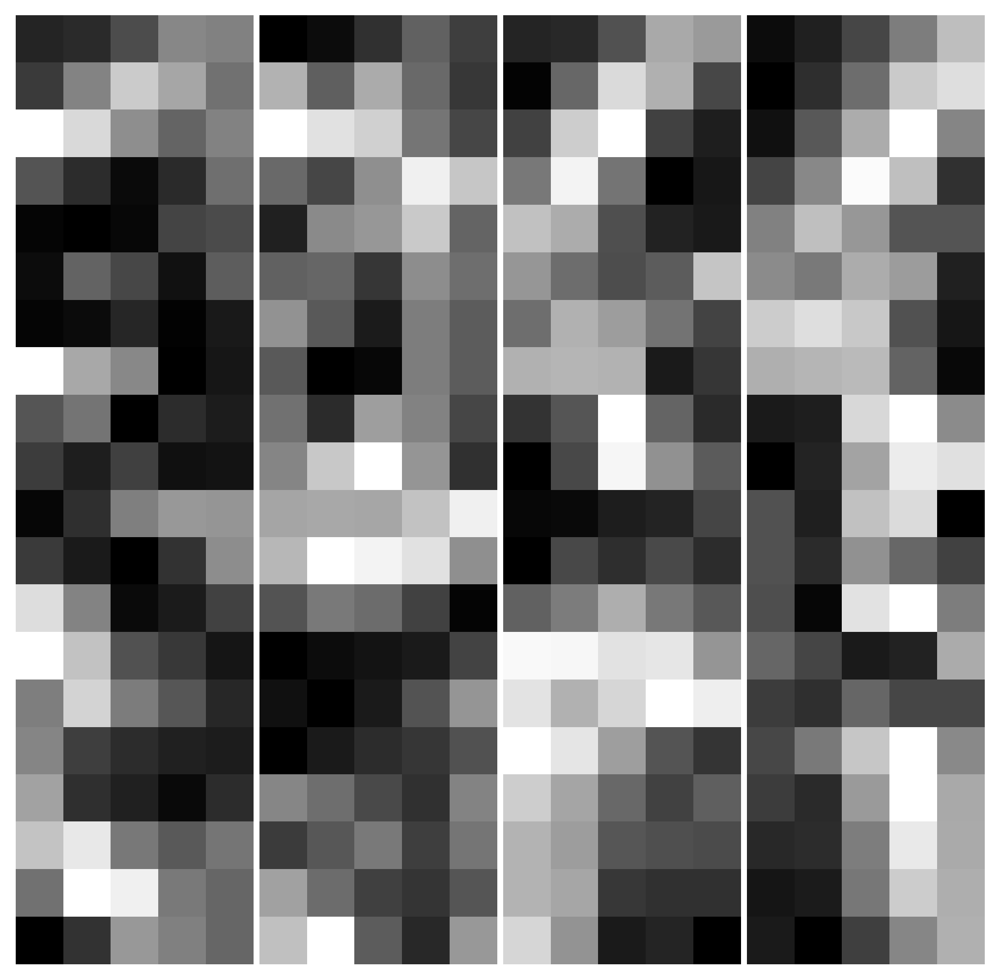

In [120]:
# visualize the convolutional kernel in the only convolutional layer of the CNN based on seed 42
# 16 * 5 * 5
best_random_seed = 42
# load the best model
best_model_cnn = torch.load(PATH + 'model_cnn_seed_42.pkl')

params = list(best_model_cnn.parameters())[0] # tensor on GPU, shape: (16, 1, 5, 5)
params = params.cpu().detach()
print(params.shape)
# use torch.squeeze to remove the channel dimension
params = torch.squeeze(params).numpy() # numpy array
print(params.shape)

plot_param_cnn(
    params = params, 
    grid_height = 4, 
    grid_width = 4
)


#### (d)

### 5. Favorite deep learning architecture

In [ ]:
# lenet 5


# resnet 18 / 34 / 50
from torchvision.models.resnet import resnet18,resnet34, resnet50, resnext50_32x4d, resnext101_32x8d

### 6. Warm up question

### 7. Favorite deep learning architecture